<a href="https://colab.research.google.com/github/ronan777/HydroProc/blob/main/DetectNew.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q condacolab
import condacolab
condacolab.install()
!conda update -n base -c conda-forge conda
#!pip install obspy
!conda install obspy
from obspy.clients.fdsn import Client
from obspy import UTCDateTime
from obspy import read_inventory
from obspy import read
import obspy.core.stream as st
import obspy.signal.cross_correlation as cc
import obspy.signal.filter as flt
import obspy.signal.trigger as trg
import obspy.signal.freqattributes as frq
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import scipy.optimize as opt
import math
import gc


✨🍰✨ Everything looks OK!
Channels:
 - conda-forge
Platform: linux-64
Solving environment: - \ | / - done


==> WARNING: A newer version of conda exists. <==
    current version: 24.11.3
    latest version: 25.1.1

Please update conda by running

    $ conda update -n base -c conda-forge conda



# All requested packages already installed.

Channels:
 - conda-forge
Platform: linux-64
Solving environment: / - \ | done


==> WARNING: A newer version of conda exists. <==
    current version: 24.11.3
    latest version: 25.1.1

Please update conda by running

    $ conda update -n base -c conda-forge conda



# All requested packages already installed.



16800.0
(-1.9386950000000207, 0.49834692578129824) (-1.3987489999999372, -1.4550044492706635)
(-0.31888584116312174, -1.1124813333333192, -0.011333333333333334) (0.0, 0.0, 0.0) (0.49834692578129824, -1.9386950000000207, -0.008) (-1.4550044492706635, -1.3987489999999372, -0.026)


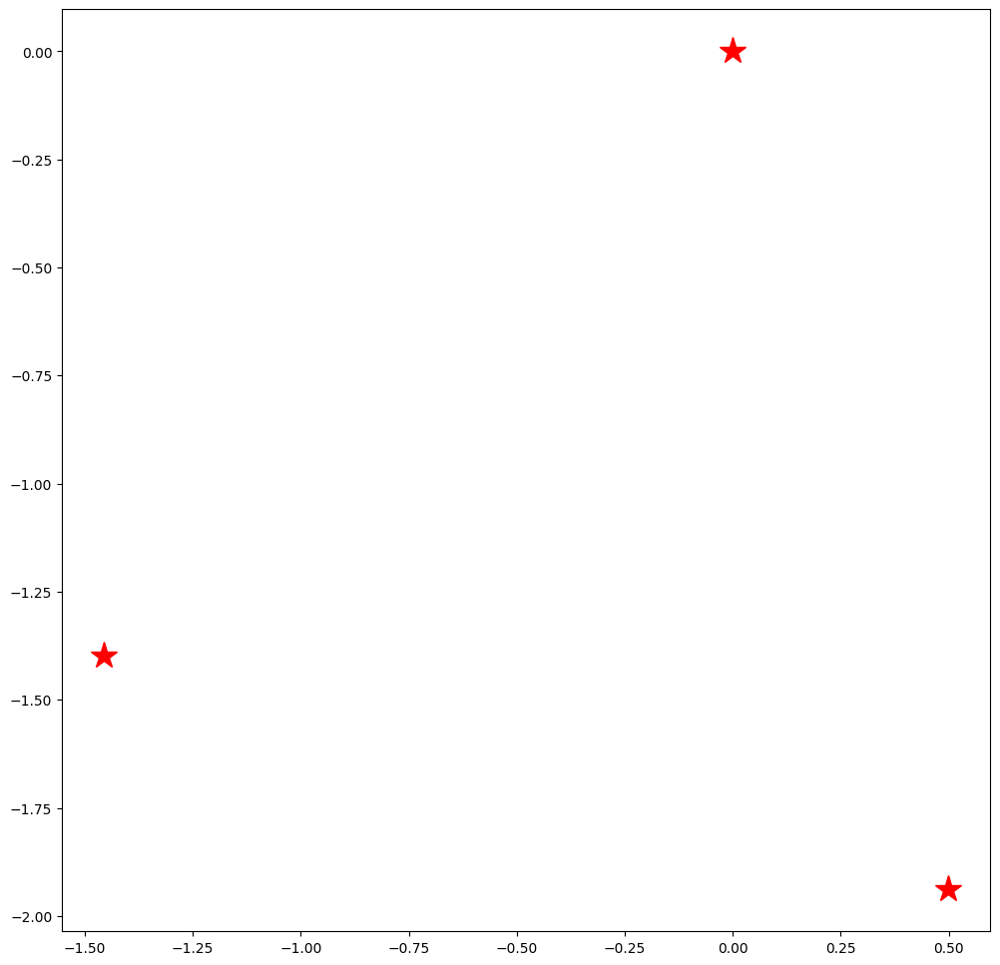

In [4]:
##
# Parameter initialization
#
#timestring="2024-02-21 01:00:00"
#timestring="2024-02-20 23:00:00"
#timestring="2024-02-20 21:00:00"
#timestring="2024-02-20 19:00:00"
#timestring="2024-02-20 17:00:00"
#timestring="2024-02-20 15:00:00"
#timestring="2024-02-20 14:00:00"
#timestring="2024-02-20 12:00:00"
#timestring="2024-02-20 10:00:00"
#timestring="2024-02-20 09:30:00"
#timestring="2024-02-20 09:00:00"
#timestring="2024-02-20 07:00:00"
#timestring="2024-02-20 07:30:00"
#timestring="2024-02-20 05:30:00"
#timestring="2024-02-20 05:10:00"
#timestring="2024-02-20 03:00:00"
#timestring="2024-02-20 03:45:00"
#timestring="2024-02-20 01:00:00"
#timestring="2024-02-20 00:12:00"
#timestring="2024-02-20 02:00:00"
#timestring="2024-02-20 02:20:00"
#timestring="2024-02-20 02:22:00"
#timestring="2024-02-20 02:30:00"
#timestring="2024-02-19 23:00:00"
#timestring="2024-02-19 21:00:00"
timestring="2024-02-19 22:40:00"
#timestring="2024-02-19 19:00:00"
#timestring="2024-02-19 18:20:00"
timestring0="2024-02-19 18:00:00"
starttime=UTCDateTime(timestring)
starttime0=UTCDateTime(timestring0)
firsttime=starttime-starttime0
print(firsttime)
#Interval = 36000
#Interval = 300
#Interval = 3600
#Interval = 7200
Interval = 1800
#Interval = 9600
#Interval = 1200
#Interval = 960
#Interval = 10
path="/content/drive/MyDrive/MSEED/"
hvel = 1.48
depth = -0.750
coord_correction = False
#
#
#
# Map of the triplet
#
#
#
h11s1=(18.50827,166.700272)
h11s2=(18.49082,166.705002)
h11s3=(18.49568,166.686462)
kmdeg=111.1
x2=(kmdeg*(h11s2[0]-h11s1[0]),kmdeg*(h11s2[1]-h11s1[1])*math.cos(np.pi*18.5/180))
x3=(kmdeg*(h11s3[0]-h11s1[0]),kmdeg*(h11s3[1]-h11s1[1])*math.cos(np.pi*18.5/180))
print(x2,x3)
S1_i = (0., 0., 0.)
S2_i = (x2[1], x2[0], -0.008)
S3_i = (x3[1], x3[0], -0.026)
S1 = S1_i
S2 = S2_i
S3 = S3_i
S0 = ((S1[0]+S2[0]+S3[0])/3, (S1[1]+S2[1]+S3[1])/3, (S1[2]+S2[2]+S3[2])/3)
print(S0, S1,S2,S3)
#Delta_S = np.load(path+"Delta_S"+"_"+timestring+"_"+str(Interval)+".npy")

fig, ax = plt.subplots(figsize=(12, 12), )
plt.plot([0],[0],'r*', markersize=20)
plt.plot([x2[1]],[x2[0]],'r*', markersize=20)
plt.plot([x3[1]],[x3[0]],'r*', markersize=20)
plt.plot([0],[0],'r-')
if (coord_correction):
  Delta_S = np.load(path+"Delta_S"+"_"+timestring+"_"+str(Interval)+".npy")
# plt.plot([Delta_S[1]]+Delta_S[0],[Delta_S[2]]+Delta_S[3],'r.', markersize=20)
  plt.plot([x3[1]]+Delta_S[6],[x3[0]]+Delta_S[7],'r.', markersize=20)
  plt.plot([x2[1]]+Delta_S[3],[x2[0]]+Delta_S[4],'r.', markersize=20)
  plt.plot(Delta_S[0],Delta_S[1],'r.', markersize=20)
  plt.plot([x3[1]]+Delta_S[6],[x3[0]]+Delta_S[7]+Delta_S[8],'ko', markersize=5)
  plt.plot([x2[1]]+Delta_S[3],[x2[0]]+Delta_S[4]+Delta_S[5],'ko', markersize=5)
  plt.plot(Delta_S[0],Delta_S[1]+Delta_S[2],'ko', markersize=5)
  ax = plt.figure(figsize=(24, 12)).add_subplot(projection='3d')
  t1x=(S1[0],S2[0],S3[0], S1[0])
  t1y=(S1[1],S2[1],S3[1], S1[1])
  t1z=(S1[2],S2[2],S3[2], S1[2])
  ax.plot(t1x,t1y,t1z,'r-')
  t2x=(S1[0]+Delta_S[0],S2[0]+Delta_S[3],S3[0]+Delta_S[6], S1[0]+Delta_S[0])
  t2y=(S1[1]+Delta_S[1],S2[1]+Delta_S[4],S3[1]+Delta_S[7], S1[1]+Delta_S[1])
  t2z=(S1[2]+Delta_S[2],S2[2]+Delta_S[5],S3[2]+Delta_S[8], S1[2]+Delta_S[2])
  ax.plot(t2x,t2y,t2z,'k-')
  l1x = (S1[0],S1[0]+Delta_S[0])
  l1y = (S1[1],S1[1]+Delta_S[1])
  l1z = (0.,0.)
  ax.plot(l1x,l1y,l1z,'r--')
  l1x = (S2[0],S2[0]+Delta_S[3])
  l1y = (S2[1],S2[1]+Delta_S[4])
  l1z = (0.,0.)
  ax.plot(l1x,l1y,l1z,'r--')
  l1x = (S3[0],S3[0]+Delta_S[6])
  l1y = (S3[1],S3[1]+Delta_S[7])
  l1z = (0.,0.)
  ax.plot(l1x,l1y,l1z,'r--')
  l1x = (S1[0]+Delta_S[0],S1[0]+Delta_S[0])
  l1y = (S1[1]+Delta_S[1],S1[1]+Delta_S[1])
  l1z = (0.,Delta_S[2])
  ax.plot(l1x,l1y,l1z,'k--')
  l1x = (S2[0]+Delta_S[3],S2[0]+Delta_S[3])
  l1y = (S2[1]+Delta_S[4],S2[1]+Delta_S[4])
  l1z = (0.,Delta_S[5])
  ax.plot(l1x,l1y,l1z,'k--')
  l1x = (S3[0]+Delta_S[6],S3[0]+Delta_S[6])
  l1y = (S3[1]+Delta_S[7],S3[1]+Delta_S[7])
  l1z = (0.,Delta_S[8])
  ax.plot(l1x,l1y,l1z,'k--')
  siz = ([200])
  ax.scatter(S1[0], S1[1], S1[2], c='r', marker='*', s=siz)
  ax.scatter(S2[0], S2[1], S2[2], c='r', marker='*', s=siz)
  ax.scatter(S3[0], S3[1], S3[2], c='r', marker='*', s=siz)
  ax.scatter(Delta_S[0], Delta_S[1], 0.,c='r',marker='.', s=siz)
  ax.scatter(S2[0]+Delta_S[3], S2[1]+Delta_S[4], 0.,c='r',marker='.', s=siz)
  ax.scatter(S3[0]+Delta_S[6], S3[1]+Delta_S[7], 0.,c='r',marker='.', s=siz)
  ax.scatter(Delta_S[0], Delta_S[1],Delta_S[2],c='k',marker='.', s=siz)
  ax.scatter(S2[0]+Delta_S[3], S2[1]+Delta_S[4],Delta_S[5],c='k',marker='.', s=siz)
  ax.scatter(S3[0]+Delta_S[6], S3[1]+Delta_S[7],Delta_S[8],c='k',marker='.', s=siz)
  elev = 40.
  azim = 120.
  roll = 180
  ax.view_init(elev, azim, roll)
#plt.xticks(fontsize=16)
#plt.yticks(fontsize=16)
  ax.set_xlabel("Longitude", size = 16)
  ax.set_ylabel("Latitude", size = 16)
  ax.set_zlabel("Depth", size = 16)
  ticks = np.arange(0.,2,0.5)
#ax.set_xticks(ticks)
#ax.set_yticks(size = 20)
  ax.set_zticks(ticks)
  ax.set_zlim(0, 2.)
#plt.ylabel('Latitude', size=20)
#plt.xlabel('Longitude', size=20)
#plt.zlabel('Depth', size=20)
#plt.annotate('H11S1',xy=(0,0),xytext=(0,0.1),fontsize=20)
#plt.annotate('H11S2',xy=(x2[1],x2[0]),xytext=(x2[1],x2[0]+0.1),fontsize=20)
#plt.annotate('H11S3',xy=(x3[1],x3[0]),xytext=(x3[1],x3[0]+0.1),fontsize=20)
  plt.xlim([-2,1.])
  plt.ylim([-2.5,0.5])
#plt.zlim([0.,0.5])
  plt.show()
  S1 = ([Delta_S[1]]+Delta_S[0],[Delta_S[2]]+Delta_S[3])
  S2 = ([x3[1]]+Delta_S[6],[x3[0]]+Delta_S[7])
  S3 = ([x2[1]]+Delta_S[3],[x2[0]]+Delta_S[4])

[1. 1.]


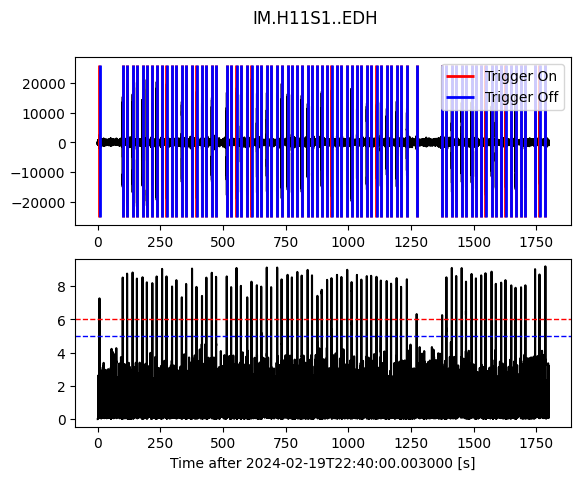

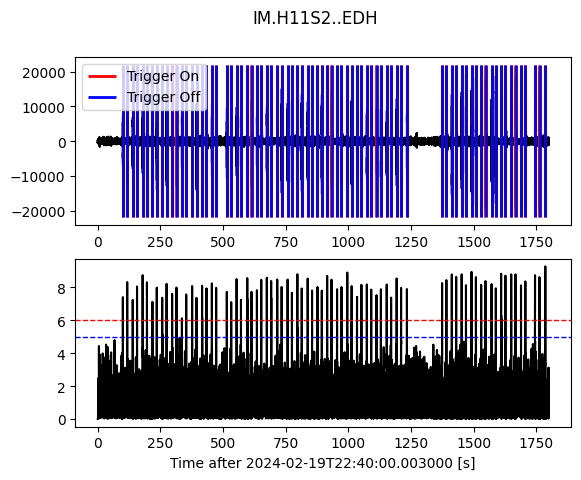

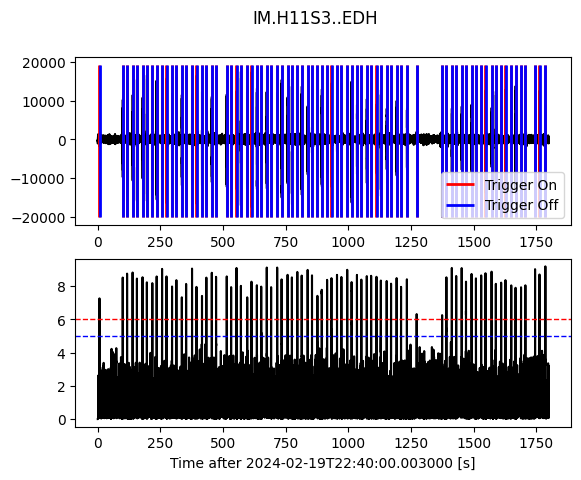

number of picks env1: 80
number of picks env2: 78
number of picks env3: 79
Time in minutes: 1.6584
central frequencies: 17.16 17.79 17.03 Average: 17.328384126685247
Segment 1 Time step: 250.0 80 segments
Times of pick onsets: 99.504 100.1 99.68
Shifts and maxs: -3.002 0.8892703787168098 -2.49 0.5841205982537134 -2.846 0.8141150588566681
Norm: 13.784026943541067
Length of quefrency: 26
Time in minutes: 1.9476666666666667
central frequencies: 20.93 21.2 21.08 Average: 21.072909379614742
Segment 2 Time step: 250.0 80 segments
Times of pick onsets: 116.86 117.376 117.032
Shifts and maxs: -3.002 0.8927927057231836 -2.506 0.6769685831941011 -2.85 0.8624179877761873
Norm: 14.00117069178152
Length of quefrency: 26
Time in minutes: 2.3156000000000003
central frequencies: 17.54 17.74 17.58 Average: 17.619285311942672
Segment 3 Time step: 250.0 80 segments
Times of pick onsets: 138.936 139.492 139.096
Shifts and maxs: -3.002 0.8549255401531627 -2.53 0.6098049183882855 -2.858 0.835165282671722
No

<ipython-input-10-0a5062ae3aeb>:399: RuntimeWarning: divide by zero encountered in log
  log_X = np.log(np.abs(spectrum3))


Segment 7 Time step: 250.0 80 segments
Times of pick onsets: 217.708 218.152 217.8
Shifts and maxs: -2.974 0.5867912432716177 -2.334 0.7388821898534912 -2.978 0.7938899418013328
Norm: 13.81467909172324
Length of quefrency: 26
Time in minutes: 3.9161333333333332
central frequencies: 20.7 20.82 20.88 Average: 20.80040879724407
Segment 8 Time step: 250.0 80 segments
Times of pick onsets: 234.968 235.432 235.116
Shifts and maxs: -2.99 0.8148469574153253 -2.606 0.6665422783782388 -2.89 0.8638926994656736
Norm: 14.084444079884873
Length of quefrency: 26
Time in minutes: 4.276666666666667
central frequencies: 17.3 17.26 17.43 Average: 17.329461514144853
Segment 9 Time step: 250.0 80 segments
Times of pick onsets: 256.6 257.112 256.76
Shifts and maxs: -2.954 0.7787142954291256 -2.222 0.7669599538127451 -2.862 0.7994081608680044
Norm: 13.751208927952447
Length of quefrency: 26
Time in minutes: 4.5704
central frequencies: 20.8 21.03 21.12 Average: 20.983506186819433
Segment 10 Time step: 250.0 8

/usr/local/lib/python3.11/site-packages/obspy/core/trace.py:2302: UserWarning: List of processing information in Trace.stats.processing reached maximal length of 100 entries.
  warnings.warn(msg.format(self._max_processing_info))
<ipython-input-10-0a5062ae3aeb>:381: RuntimeWarning: divide by zero encountered in log
  log_X = np.log(np.abs(spectrum1))


central frequencies: 20.71 20.82 20.9 Average: 20.810791254229073
Segment 18 Time step: 250.0 80 segments
Times of pick onsets: 433.356 433.724 433.356
Shifts and maxs: -3.002 0.6995606407894465 -2.33 0.6692345777910635 -2.99 0.8556745325183054
Norm: 13.995981430773952
Length of quefrency: 26
Time in minutes: 7.584333333333333
central frequencies: 17.0 17.21 17.62 Average: 17.276342403184746
Segment 19 Time step: 250.0 80 segments
Times of pick onsets: 455.06 455.392 455.044
Shifts and maxs: -2.57 0.6744141056422566 -2.334 0.7459504774805202 -2.998 0.8181647632168203
Norm: 13.948354147887628
Length of quefrency: 26
Time in minutes: 7.868666666666667
central frequencies: 20.95 21.15 21.35 Average: 21.149470652384508
Segment 20 Time step: 250.0 80 segments
Times of pick onsets: 472.12 472.48 472.112
Shifts and maxs: -2.998 0.6733914407033621 -2.33 0.642906112041593 -2.998 0.8024488695835925
Norm: 13.958681384837273
Length of quefrency: 26
Time in minutes: 8.579133333333335
central freque

<ipython-input-10-0a5062ae3aeb>:391: RuntimeWarning: divide by zero encountered in log
  log_X = np.log(np.abs(spectrum2))


Time in minutes: 11.242533333333334
central frequencies: 17.46 17.3 17.31 Average: 17.354588279465798
Segment 29 Time step: 250.0 80 segments
Times of pick onsets: 674.552 674.748 674.544
Shifts and maxs: -2.586 0.7366902143361053 -2.406 0.7300658997001954 -2.95 0.6812104097617039
Norm: 14.027287433250988
Length of quefrency: 26
Time in minutes: 11.5318
central frequencies: 21.27 21.07 21.16 Average: 21.166908211819475
Segment 30 Time step: 250.0 80 segments
Times of pick onsets: 691.908 691.988 691.824
Shifts and maxs: -2.646 0.7053109601118206 -2.53 0.7246867979293108 -2.706 0.5099623091373673
Norm: 13.963611864155494
Length of quefrency: 26
Time in minutes: 11.9354
central frequencies: 16.51 17.34 17.25 Average: 17.034023755576428
Segment 31 Time step: 250.0 80 segments
Times of pick onsets: 716.124 716.304 716.088
Shifts and maxs: -2.582 0.7283044167702003 -2.414 0.7049354806865765 -2.978 0.791200655935575
Norm: 14.02743658829129
Length of quefrency: 26
Time in minutes: 12.22746666

<ipython-input-10-0a5062ae3aeb>:439: RuntimeWarning: divide by zero encountered in log
  log_X = np.log(np.abs(spectrum2))


Time in minutes: 22.909333333333333
central frequencies: 16.56 17.24 17.67 Average: 17.157007235151692
Segment 59 Time step: 250.0 80 segments
Times of pick onsets: 1374.56 1374.384 1374.616
Shifts and maxs: -2.738 0.6618311714762365 -2.694 0.3504891003099376 -2.998 0.8740550233888085
Norm: 14.10246478589161
Length of quefrency: 26
Time in minutes: 23.192466666666668
central frequencies: 20.65 20.83 20.99 Average: 20.823625835139193
Segment 60 Time step: 250.0 80 segments
Times of pick onsets: 1391.548 1391.54 1391.792
Shifts and maxs: -2.998 0.7154922468203833 -2.974 0.3788495597011851 -2.842 0.8568541392740039
Norm: 14.064713683768634
Length of quefrency: 26
Time in minutes: 23.554
central frequencies: 17.43 17.42 17.68 Average: 17.509160395453247
Segment 61 Time step: 250.0 80 segments
Times of pick onsets: 1413.24 1413.168 1413.412
Shifts and maxs: -2.974 0.7402448291161272 -2.954 0.6278020124445954 -2.83 0.8721330733060484
Norm: 14.014259447801027
Length of quefrency: 26
Time in m

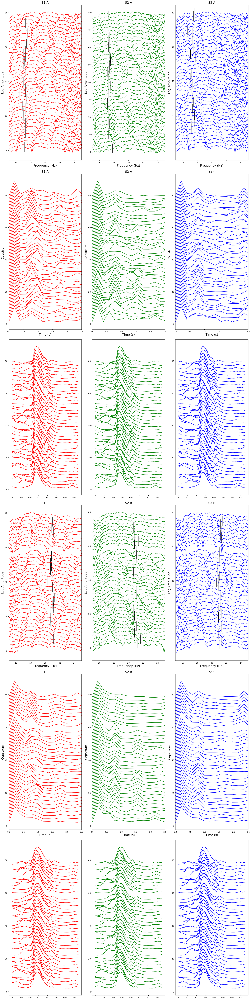

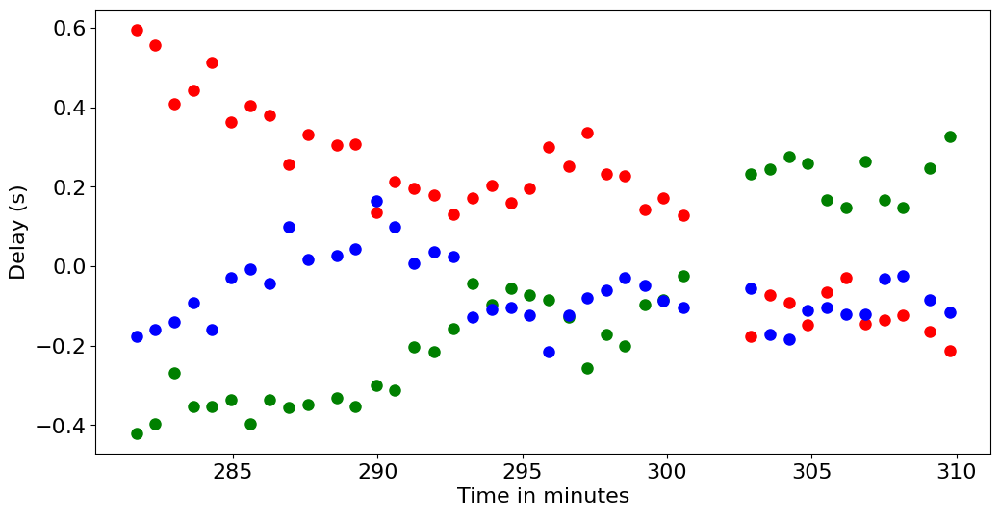

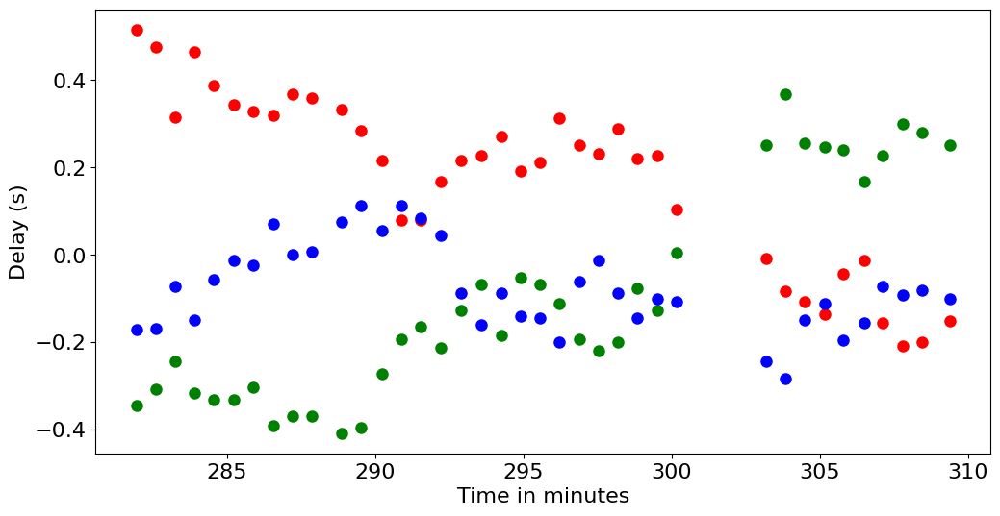

In [10]:
#
# Read from disk and process the waveforms
#
#
# Read waveform segments around individual first hydrophone picks
# on all three hydrophones. Separate A and B calls using the central
# frequency
#
mincor=0.5
dT = 10
ndT = dT*250+1
#
adjustCC = True
plotdelay="delays_"+timestring+"_"+str(Interval)+".png"
plotpdelay="pdelays_"+timestring+"_"+str(Interval)+".png"
plotamp="amps_"+timestring+"_"+str(Interval)+".png"
plotdistance="dist_"+timestring+"_"+str(Interval)+".png"
plotdistance_cor="cor_dist_"+timestring+"_"+str(Interval)+".png"
#
# Get epoch time from UTCDateTime
# Get two hours of data
#
delay12 = np.empty(0)
delay31 = np.empty(0)
delay23 = np.empty(0)
cdelay12 = np.empty(0)
cdelay31 = np.empty(0)
cdelay23 = np.empty(0)
ctype = np.empty(0)


a1 = np.empty(0)
a2 = np.empty(0)
a3 = np.empty(0)

times = np.empty(0)
typeAB = np.empty(0)
maxcor12 = np.empty(0)
maxcor31 = np.empty(0)
tpoints = np.empty(0)
freqs = np.empty(0)
#
tseg=np.empty(ndT)
tcseg=np.empty(1501)
nt=0
while nt<ndT:
  tseg[nt] = nt/250.
  nt+=1
nt=0

while nt<1501:
  tcseg[nt] = nt/250.-3.
  nt+=1
A1=np.empty(0)
A2=np.empty(0)
A3=np.empty(0)
A = np.zeros([0,2])
#print(A)
B = np.zeros(0)
C = np.zeros(2)
C[0] = 1.
C[1] = 1.
print(C)
a12=np.zeros(0)
a31=np.zeros(0)
#
k = 0
#
maxdel = 100.
#
#
mseedfileS2="H11S2_"+timestring+"_"+str(Interval)+".mseed"
mseedfileS3="H11S3_"+timestring+"_"+str(Interval)+".mseed"
mseedfileS1="H11S1_"+timestring+"_"+str(Interval)+".mseed"
#
corsec1A="corA_H11S1_"+timestring+"_"+str(Interval)+".mseed"
corsec1B="corB_H11S1_"+timestring+"_"+str(Interval)+".mseed"
corsec2A="corA_H11S2_"+timestring+"_"+str(Interval)+".mseed"
corsec2B="corB_H11S2_"+timestring+"_"+str(Interval)+".mseed"
corsec3A="corA_H11S3_"+timestring+"_"+str(Interval)+".mseed"
corsec3B="corB_H11S3_"+timestring+"_"+str(Interval)+".mseed"
refsec1A="refA_H11S1_"+timestring+"_"+str(Interval)+".mseed"
refsec1B="refB_H11S1_"+timestring+"_"+str(Interval)+".mseed"
refsec2A="refA_H11S2_"+timestring+"_"+str(Interval)+".mseed"
refsec2B="refB_H11S2_"+timestring+"_"+str(Interval)+".mseed"
refsec3A="refA_H11S3_"+timestring+"_"+str(Interval)+".mseed"
refsec3B="refB_H11S3_"+timestring+"_"+str(Interval)+".mseed"
fcorsec1A=path+"corA_H11S1_"+timestring+"_"+str(Interval)+".png"
fcorsec1B=path+"corB_H11S1_"+timestring+"_"+str(Interval)+".png"
fcorsec2A=path+"corA_H11S2_"+timestring+"_"+str(Interval)+".png"
fcorsec2B=path+"corB_H11S2_"+timestring+"_"+str(Interval)+".png"
fcorsec3A=path+"corA_H11S3_"+timestring+"_"+str(Interval)+".png"
fcorsec3B=path+"corB_H11S3_"+timestring+"_"+str(Interval)+".png"
frefsec1A=path+"refA_H11S1_"+timestring+"_"+str(Interval)+".png"
frefsec1B=path+"refB_H11S1_"+timestring+"_"+str(Interval)+".png"
frefsec2A=path+"refA_H11S2_"+timestring+"_"+str(Interval)+".png"
frefsec2B=path+"refB_H11S2_"+timestring+"_"+str(Interval)+".png"
frefsec3A=path+"refA_H11S3_"+timestring+"_"+str(Interval)+".png"
frefsec3B=path+"refB_H11S3_"+timestring+"_"+str(Interval)+".png"
hydrophone = "H11S"
filesourceA = "Source_A"+"_"+hydrophone+"_stack_"+timestring+"_"+str(Interval)+".mseed"
filesourceB = "Source_B"+"_"+hydrophone+"_stack_"+timestring+"_"+str(Interval)+".mseed"
#
st1 = read(path+mseedfileS1)
st2 = read(path+mseedfileS2)
st3 = read(path+mseedfileS3)
wvltA = read(path+filesourceA)
wvltB = read(path+filesourceB)
#shift1A = np.load(path+"A_H11S1_shift_"+timestring+"_"+str(Interval)+".npy")
#shift2A = np.load(path+"A_H11S2_shift_"+timestring+"_"+str(Interval)+".npy")
#shift3A = np.load(path+"A_H11S3_shift_"+timestring+"_"+str(Interval)+".npy")
#shift1B = np.load(path+"B_H11S1_shift_"+timestring+"_"+str(Interval)+".npy")
#shift2B = np.load(path+"B_H11S2_shift_"+timestring+"_"+str(Interval)+".npy")
#shift3B = np.load(path+"B_H11S3_shift_"+timestring+"_"+str(Interval)+".npy")
#
#
#print("Shift data length:",len(shift1A),len(shift2A),len(shift3A),len(shift1B),len(shift2B),len(shift3B))
sta=0.1
lta=1.
#
#
dt = st1[0].stats.sampling_rate
slta1 = trg.classic_sta_lta(st1[0].detrend(type='linear').data,int(sta*dt),int(lta*dt))
trig1=trg.plot_trigger(st1[0],slta1,6.,5.)
on_off1 = trg.trigger_onset(slta1,6.,5.)
slta2 = trg.classic_sta_lta(st2[0].detrend(type='linear').data,int(sta*dt),int(lta*dt))
trig2=trg.plot_trigger(st2[0],slta2,6.,5.)
on_off2 = trg.trigger_onset(slta2,6.,5.)
slta3 = trg.classic_sta_lta(st3[0].detrend(type='linear').data,int(sta*dt),int(lta*dt))
trig3=trg.plot_trigger(st3[0],slta1,6.,5.)
on_off3 = trg.trigger_onset(slta3,6.,5.)
#
nseg = len(on_off1)
print("number of picks env1:" , nseg)
nseg2 = len(on_off2)
print("number of picks env2:" , nseg2)
nseg3 = len(on_off3)
print("number of picks env3:" , nseg3)
first = True
npick = 0
#fig, ax = plt.subplots(figsize=(12, 12), )
mask = st.Trace()
mask.data = np.zeros(1+int(ndT/2))
hanning = np.hanning(340)
for i in range(340):
  mask.data[i+150] = 1.
fig = plt.figure(figsize=(18, 72), layout='constrained')
axs = fig.subplot_mosaic([["Aspec1","Aspec2","Aspec3"],
                          ["Aceps1","Aceps2","Aceps3"],
                          ["Asl1","Asl2","Asl3"],
                          ["Bspec1","Bspec2","Bspec3"],
                          ["Bceps1","Bceps2","Bceps3"],
                          ["Bsl1","Bsl2","Bsl3"]])
ftr = st.Trace(data=mask.data)
nA=0
nB=0
while k < nseg:
#
# Find detection on other envelope within +- 3s.
# Skip if less than three seconds after previous pick
#
  if (k > 0 and (on_off1[k][0]-on_off1[k-1][0])/dt < 3.):
    k += 1
    continue
#  if (picktimes):
  yes2 = False
  yes3 = False
  for det2 in range (len(on_off2)):
      if (abs(on_off2[det2][0]-on_off1[k][0])/dt) < 3 :
        yes2 = True
        break
  for det3 in range (len(on_off3)):
      if (abs(on_off3[det3][0]-on_off1[k][0])/dt) < 3 :
        yes3 = True
        break
  if (yes2 and yes3):
      npick += 1
  else :
      k += 1
      continue
  startseg = starttime+on_off1[k][0]/dt - dT/4
  endseg = startseg+dT
  print("Time in minutes:", on_off1[k][0]/dt/60)
  raw1 = st1[0].slice(startseg,endseg).detrend(type='linear').data
  raw2 = st2[0].slice(startseg,endseg).detrend(type='linear').data
  raw3 = st3[0].slice(startseg,endseg).detrend(type='linear').data
  sind = int(on_off1[k][0])-250
  eind = int(on_off1[k][0])+500
  sl1 = slta1[sind:eind]
  sl2 = slta1[sind:eind]
  sl3 = slta1[sind:eind]
  fk = [-1,1.]
  lf= 15.
  hf = 25.
  sf = int(1+int(ndT/2)*lf/125.)
  ef = int(1+int(ndT/2)*hf/125.)
  cfreq1 = frq.central_frequency(raw1, dt, 0.5, fk)
  cfreq2 = frq.central_frequency(raw2, dt, 0.5, fk)
  cfreq3 = frq.central_frequency(raw3, dt, 0.5, fk)
  cfreq = (cfreq1+cfreq2+cfreq3)/3.
  print("central frequencies:", round(cfreq1,2), round(cfreq2,2), round(cfreq3,2), "Average:",cfreq)
#
#
#
#  if(cfreq < 20):
#    cc1 = shift1A[nA]
#    cc2 = shift2A[nA]
#    cc3 = shift3A[nA]
#  else:
#    cc1 = shift1B[nB]
#    cc2 = shift2B[nB]
#    cc3 = shift3B[nB]
#  print("Shifts:",cc1,cc2,cc3)

  delay12 = np.append(delay12,(on_off2[det2][0]-on_off1[k][0])/dt)
  delay23 = np.append(delay23,(on_off3[det3][0]-on_off2[det2][0])/dt)
  delay31 = np.append(delay31,(on_off1[k][0]-on_off3[det3][0])/dt)
#  cdelay12 = np.append(cdelay12,(on_off2[det2][0]-on_off1[k][0])/dt+(cc2-cc1)/dt)
#  cdelay23 = np.append(cdelay23,(on_off3[det3][0]-on_off2[det2][0])/dt+(cc3-cc2)/dt)
#  cdelay31 = np.append(cdelay31,(on_off1[k][0]-on_off3[det3][0])/dt+(cc1-cc3)/dt)

  tpoints = np.append(tpoints,(firsttime+on_off1[k][0]/dt)/60.)

  if(cfreq < 20):
    ctype = np.append(ctype,'A')
  else:
    ctype = np.append(ctype,'B')

  n1 = len(raw1)
  n2 = len(raw2)
  if (n1 != 1): exit(1)
  print ("Segment",k,"Time step:", dt, nseg, "segments")
  if (yes2 and yes3) :
    print ("Times of pick onsets:", on_off1[k][0]/dt, on_off2[det2][0]/dt, on_off3[det3][0]/dt)
  if (cfreq < 20):
    cross1=cc.correlate_template(raw1,wvltA[0].data)
    cross2=cc.correlate_template(raw2,wvltA[0].data)
    cross3=cc.correlate_template(raw3,wvltA[0].data)
  else:
    cross1=cc.correlate_template(raw1,wvltB[0].data)
    cross2=cc.correlate_template(raw2,wvltB[0].data)
    cross3=cc.correlate_template(raw3,wvltB[0].data)

  (shift1,max1)=cc.xcorr_max(cross1,abs_max=False)
  (shift2,max2)=cc.xcorr_max(cross2,abs_max=False)
  (shift3,max3)=cc.xcorr_max(cross3,abs_max=False)

  if (first):
    traceA1 = st.Trace()
    traceB1 = st.Trace()
    A1 = st.Trace()
    B1 = st.Trace()
    ref1A=st.Stream(traces=[A1])
    ref1B=st.Stream(traces=[B1])
    cor1A=st.Stream(traces=[traceA1])
    cor1B=st.Stream(traces=[traceB1])
    traceA2 = st.Trace()
    traceB2 = st.Trace()
    A2 = st.Trace()
    B2 = st.Trace()
    ref2A=st.Stream(traces=[A2])
    ref2B=st.Stream(traces=[B2])
    cor2A=st.Stream(traces=[traceA2])
    cor2B=st.Stream(traces=[traceB2])
    traceA3 = st.Trace()
    traceB3 = st.Trace()
    A3 = st.Trace()
    B3 = st.Trace()
    ref3A=st.Stream(traces=[A3])
    ref3B=st.Stream(traces=[B3])
    cor3A=st.Stream(traces=[traceA3])
    cor3B=st.Stream(traces=[traceB3])
    ref1A.remove(A1)
    ref1B.remove(B1)
    ref2A.remove(A2)
    ref2B.remove(B2)
    ref3A.remove(A3)
    ref3B.remove(B3)
    cor1A.remove(traceA1)
    cor1B.remove(traceB1)
    cor2A.remove(traceA2)
    cor2B.remove(traceB2)
    cor3A.remove(traceA3)
    cor3B.remove(traceB3)
  first = False
#  tpoints=np.append(tpoints,(firsttime+on_off1[k][0]/dt)/60.)
  print ("Shifts and maxs:",shift1/dt,max1,shift2/dt,max2, shift3/dt,max3)
#
#
  a1=np.append(a1,max1)
  a2=np.append(a2,max2)
  a3=np.append(a3,max3)
#
#
#    Build-up section
#
  ctr = st.Trace()
  ctr.stats.distance = (startseg - starttime)/0.06
  ctr.stats.sampling_rate=dt
  tr = st.Trace()
  tr.stats.distance = (startseg - starttime)/0.06
  tr.stats.sampling_rate=dt
#
#    tr.stats.starttime = -3.
#
  if(cfreq > 20):
#      tr.data = np.roll(raw1,int(shift1B[nB]))
    tr.data = raw1
    ref1B.append(tr)
#      ctr.data = np.roll(cross1,int(shift1B[nB]))
    ctr.data = cross1
    cor1B.append(ctr)
  else:
#      tr.data = np.roll(raw1,int(shift1A[nA]))
    tr.data = raw1
    ref1A.append(tr)
    ctr.data = cross1
#      ctr.data = np.roll(cross1,int(shift1A[nA]))
    cor1A.append(ctr)
#
#  print(sect2)
#
  ctr = st.Trace()
  ctr.stats.distance = (startseg-starttime)/0.06
  ctr.stats.sampling_rate=dt
  tr = st.Trace()
  tr.stats.distance = (startseg-starttime)/0.06
  tr.stats.sampling_rate=dt
#
  if (cfreq > 20):
#
    tr.data = raw2
    ctr.data = cross2
    ref2B.append(tr)
#
    cor2B.append(ctr)
  else:
#
    tr.data = raw2
    ctr.data = cross2
    ref2A.append(tr)
    cor2A.append(ctr)
#
#
  ctr = st.Trace()
  ctr.stats.distance = (startseg-starttime)/0.06
  ctr.stats.sampling_rate=dt

  tr = st.Trace()
  tr.stats.distance = (startseg-starttime)/0.06
  tr.stats.sampling_rate=dt
#
  if (cfreq > 20):
    tr.data = raw3
    ctr.data = cross3
    ref3B.append(tr)
    cor3B.append(ctr)
#
  else:
    tr.data = raw3
    ctr.data = cross3
    ref3A.append(tr)
    cor3A.append(ctr)
#  nA += 1
#
#
#
#  print("n10 and cfreq",n10, cfreq)
  if (cfreq > 20):
        nB += 1
    #    fig, ax = plt.subplots(figsize=(12, 12), )
        spectrum1 = np.fft.rfft(raw1)
        spectrum2 = np.fft.rfft(raw2)
        spectrum3 = np.fft.rfft(raw3)
    #    print(spectrum)
        freqs = np.fft.rfftfreq(ndT, d=1./dt)

        axs["Bspec1"].plot(cfreq1,k+1, 'k|' , markersize=50 )
        axs["Bspec2"].plot(cfreq2,k+1, 'k|' , markersize=50 )
        axs["Bspec3"].plot(cfreq3,k+1, 'k|' , markersize=50 )
        log_X = np.log(np.abs(spectrum1))
        ftr.data = log_X[sf:ef]
        ftr.stats.sampling_rate = 1./dt
        ftr.stats.starttime = 0.
#
#
        norm = np.max(ftr.data)
        print("Norm:",norm)
        axs["Bspec1"].plot(freqs[sf:ef],k+16.*ftr.detrend(type='linear').data/norm, 'r')
        ceps1 = np.fft.rfft(ftr.detrend(type='linear').data)
        log_X = np.log(np.abs(spectrum2))
        ftr.data = log_X[sf:ef]
        ftr.stats.sampling_rate = 1./dt
        ftr.stats.starttime = 0.
#
#
        axs["Bspec2"].plot(freqs[sf:ef],k+16.*ftr.detrend(type='linear').data/norm, 'g')
        ceps2 = np.fft.rfft(ftr.detrend(type='linear').data)
        log_X = np.log(np.abs(spectrum3))
        ftr.data = log_X[sf:ef]
        ftr.stats.sampling_rate = 1./dt
        ftr.stats.starttime = 0.
#
#
        axs["Bspec3"].plot(freqs[sf:ef],k+16.*ftr.detrend(type='linear').data/norm, 'b')
        ceps3 = np.fft.rfft(ftr.detrend(type='linear').data)
        df = freqs[1] - freqs[0]
        quefrency_vector = np.fft.rfftfreq(ceps1.size, df)
        print("Length of quefrency:",len(quefrency_vector))
        lenceps = len(quefrency_vector)
        axs["Bceps1"].plot(quefrency_vector, k+10.*np.abs(ceps1[0:lenceps])/np.max(np.abs(ceps1)), 'r')
        axs["Bceps2"].plot(quefrency_vector, k+10.*np.abs(ceps2[0:lenceps])/np.max(np.abs(ceps2)), 'g')
        axs["Bceps3"].plot(quefrency_vector, k+10.*np.abs(ceps3[0:lenceps])/np.max(np.abs(ceps3)), 'b')
        axs["Bsl1"].plot(k+10.*sl1/np.max(sl1), 'r')
        axs["Bsl2"].plot(k+10.*sl2/np.max(sl2), 'g')
        axs["Bsl3"].plot(k+10.*sl3/np.max(sl3), 'b')
  else:
        nA += 1
        #    fig, ax = plt.subplots(figsize=(12, 12), )
        spectrum1 = np.fft.rfft(raw1)
        spectrum2 = np.fft.rfft(raw2)
        spectrum3 = np.fft.rfft(raw3)
    #    print(spectrum)
        freqs = np.fft.rfftfreq(ndT, d=1./dt)

        axs["Aspec1"].plot(cfreq1,k+1, 'k|' , markersize=50 )
        axs["Aspec2"].plot(cfreq2,k+1, 'k|' , markersize=50 )
        axs["Aspec3"].plot(cfreq3,k+1, 'k|' , markersize=50 )
        log_X = np.log(np.abs(spectrum1))
        ftr.data = log_X[sf:ef]
        ftr.stats.sampling_rate = 1./dt
        ftr.stats.starttime = 0.
#
#
        norm = np.max(ftr.data)
        print("Norm:",norm)
        axs["Aspec1"].plot(freqs[sf:ef],k+16.*ftr.detrend(type='linear').data/norm, 'r')
        ceps1 = np.fft.rfft(ftr.detrend(type='linear').data)
        log_X = np.log(np.abs(spectrum2))
        ftr.data = log_X[sf:ef]
        ftr.stats.sampling_rate = 1./dt
        ftr.stats.starttime = 0.
#
#
        axs["Aspec2"].plot(freqs[sf:ef],k+16.*ftr.detrend(type='linear').data/norm, 'g')
        ceps2 = np.fft.rfft(ftr.detrend(type='linear').data)
        log_X = np.log(np.abs(spectrum3))
        ftr.data = log_X[sf:ef]
        ftr.stats.sampling_rate = 1./dt
        ftr.stats.starttime = 0.
#
#
        axs["Aspec3"].plot(freqs[sf:ef],k+16.*ftr.detrend(type='linear').data/norm, 'b')
        ceps3 = np.fft.rfft(ftr.detrend(type='linear').data)
        df = freqs[1] - freqs[0]
        quefrency_vector = np.fft.rfftfreq(ceps1.size, df)
        print("Length of quefrency:",len(quefrency_vector))
        lenceps = len(quefrency_vector)
        axs["Aceps1"].plot(quefrency_vector, k+10.*np.abs(ceps1[0:lenceps])/np.max(np.abs(ceps1)), 'r')
        axs["Aceps2"].plot(quefrency_vector, k+10.*np.abs(ceps2[0:lenceps])/np.max(np.abs(ceps2)), 'g')
        axs["Aceps3"].plot(quefrency_vector, k+10.*np.abs(ceps3[0:lenceps])/np.max(np.abs(ceps3)), 'b')
        axs["Asl1"].plot(k+10.*sl1/np.max(sl1), 'r')
        axs["Asl2"].plot(k+10.*sl2/np.max(sl2), 'g')
        axs["Asl3"].plot(k+10.*sl3/np.max(sl3), 'b')
    #    plt.plot(freqs,np.abs(spectrum))
    #    plt.show()
  k+=1
#
#
axs["Aspec1"].set_title("S1 A", fontsize=16)
axs["Aspec1"].set_xlabel("Frequency (Hz)", fontsize=16)
axs["Aspec1"].set_ylabel("Log Amplitude", fontsize=16)
axs["Aspec1"].set_xlim([lf,hf])
axs["Aspec2"].set_title("S2 A", fontsize=16)
axs["Aspec2"].set_xlabel("Frequency (Hz)", fontsize=16)
axs["Aspec2"].set_ylabel("Log Amplitude", fontsize=16)
axs["Aspec2"].set_xlim([lf,hf])
axs["Aspec3"].set_title("S3 A", fontsize=16)
axs["Aspec3"].set_xlabel("Frequency (Hz)", fontsize=16)
axs["Aspec3"].set_ylabel("Log Amplitude", fontsize=16)
axs["Aspec3"].set_xlim([lf,hf])
axs["Aceps1"].set_title("S1 A", fontsize=16)
axs["Aceps1"].set_xlabel("Time (s)", fontsize=16)
axs["Aceps1"].set_ylabel("Cepstrum", fontsize=16)
axs["Aceps1"].set_xlim([0.00,2.5])
axs["Aceps2"].set_title("S2 A", fontsize=16)
axs["Aceps2"].set_xlabel("Time (s)", fontsize=16)
axs["Aceps2"].set_ylabel("Cepstrum", fontsize=16)
axs["Aceps2"].set_xlim([0.00,2.5])
axs["Aceps3"].set_title("S3 A")
axs["Aceps3"].set_xlabel("Time (s)", fontsize=16)
axs["Aceps3"].set_ylabel("Cepstrum", fontsize=16)
axs["Aceps3"].set_xlim([0.00,2.5])
axs["Bspec1"].set_title("S1 B", fontsize=16)
axs["Bspec1"].set_xlabel("Frequency (Hz)", fontsize=16)
axs["Bspec1"].set_ylabel("Log Amplitude", fontsize=16)
axs["Bspec1"].set_xlim([lf,hf])
axs["Bspec2"].set_title("S2 B", fontsize=16)
axs["Bspec2"].set_xlabel("Frequency (Hz)", fontsize=16)
axs["Bspec2"].set_ylabel("Log Amplitude", fontsize=16)
axs["Bspec2"].set_xlim([lf,hf])
axs["Bspec3"].set_title("S3 B", fontsize=16)
axs["Bspec3"].set_xlabel("Frequency (Hz)", fontsize=16)
axs["Bspec3"].set_ylabel("Log Amplitude", fontsize=16)
axs["Bspec3"].set_xlim([lf,hf])
axs["Bceps1"].set_title("S1 B", fontsize=16)
axs["Bceps1"].set_xlabel("Time (s)", fontsize=16)
axs["Bceps1"].set_ylabel("Cepstrum", fontsize=16)
axs["Bceps1"].set_xlim([0.00,2.5])
axs["Bceps2"].set_title("S2 B", fontsize=16)
axs["Bceps2"].set_xlabel("Time (s)", fontsize=16)
axs["Bceps2"].set_ylabel("Cepstrum", fontsize=16)
axs["Bceps2"].set_xlim([0.00,2.5])
axs["Bceps3"].set_title("S3 B")
axs["Bceps3"].set_xlabel("Time (s)", fontsize=16)
axs["Bceps3"].set_ylabel("Cepstrum", fontsize=16)
axs["Bceps3"].set_xlim([0.00,2.5])
plt.show()
#
ref1A.write(path+refsec1A,format="MSEED")
ref2A.write(path+refsec2A,format="MSEED")
ref3A.write(path+refsec3A,format="MSEED")
ref1B.write(path+refsec1B,format="MSEED")
ref2B.write(path+refsec2B,format="MSEED")
ref3B.write(path+refsec3B,format="MSEED")
cor1A.write(path+corsec1A,format="MSEED")
cor2A.write(path+corsec2A,format="MSEED")
cor3A.write(path+corsec3A,format="MSEED")
cor1B.write(path+corsec1B,format="MSEED")
cor2B.write(path+corsec2B,format="MSEED")
cor3B.write(path+corsec3B,format="MSEED")
ref1A.plot(outfile=frefsec1A, format = 'png' , type='section', scale=1,
       recordstart=2, recordlength= 3,  linewidth=1,  color = 'red',
          fillcolors= (None,None) )
ref1B.plot(outfile=frefsec1B,format = 'png' , type='section', scale=1,
       recordstart=2, recordlength= 3,  linewidth=1,  color = 'red',
          fillcolors= (None,None) )
ref2A.plot(outfile=frefsec2A, format = 'png' , type='section',scale=1,
       recordstart=2, recordlength= 3,  linewidth=1,
            color = 'g', fillcolors= (None,None) )
ref2B.plot(outfile=frefsec2B, format = 'png' , type='section',scale=1,
       recordstart=2, recordlength= 3,  linewidth=1, color = 'g',
            fillcolors= (None,None) )
ref3A.plot(outfile=frefsec3A, format = 'png' , type='section',scale=1,
       recordstart=2, recordlength= 3,  linewidth=1,
            color = 'b', fillcolors= (None,None ))
ref3B.plot(outfile=frefsec3B, format = 'png' , type='section',scale=1,
       recordstart=2, recordlength= 3,  linewidth=1,
            color = 'b', fillcolors= (None,None ))
cor1A.plot(outfile=fcorsec1A, format = 'png' , type='section', scale=1,
       recordstart=0, recordlength= 6,  linewidth=1,  color = 'red',
          fillcolors= (None,None) )
cor1B.plot(outfile=fcorsec1B,format = 'png' , type='section', scale=1,
       recordstart=0, recordlength= 6,  linewidth=1,  color = 'red',
          fillcolors= (None,None) )
cor2A.plot(outfile=fcorsec2A, format = 'png' , type='section',scale=1,
       recordstart=0, recordlength= 6,  linewidth=1,
            color = 'g', fillcolors= (None,None) )
cor2B.plot(outfile=fcorsec2B, format = 'png' , type='section',scale=1,
       recordstart=0, recordlength= 6,  linewidth=1, color = 'g',
            fillcolors= (None,None) )
cor3A.plot(outfile=fcorsec3A, format = 'png' , type='section',scale=1,
       recordstart=0, recordlength= 6,  linewidth=1,
            color = 'b', fillcolors= (None,None ))
cor3B.plot(outfile=fcorsec3B, format = 'png' , type='section',scale=1,
       recordstart=0, recordlength= 6,  linewidth=1,
            color = 'b', fillcolors= (None,None ))
#
#
#
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
for k in range (nA+nB):
  if(ctype[k] == 'A'):
    plt.plot(tpoints[k],delay12[k],'r.',tpoints[k],delay23[k],'g.',tpoints[k],delay31[k],'b.', markersize=16)
#    plt.plot(tpoints[k],cdelay12[k],'r.',tpoints[k],cdelay23[k],'g.',tpoints[k],cdelay31[k],'b.', markersize=10)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim([-2.5,2.5])
plt.xlabel('Time in minutes',fontsize=16)
plt.ylabel('Delay (s)',fontsize=16)
#plt.savefig(plotdelay,format='png')
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
for k in range (nA+nB):
  if(ctype[k] == 'B'):
    plt.plot(tpoints[k],delay12[k],'r.',tpoints[k],delay23[k],'g.',tpoints[k],delay31[k],'b.', markersize=16)
#    plt.plot(tpoints[k],cdelay12[k],'r.',tpoints[k],cdelay23[k],'g.',tpoints[k],cdelay31[k],'b.', markersize=10)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim([-2.5,2.5])
plt.xlabel('Time in minutes',fontsize=16)
plt.ylabel('Delay (s)',fontsize=16)
#plt.savefig(plotdelay,format='png')
plt.show()
#
#
np.save(path+"delay1"+"_"+timestring+"_"+str(Interval),delay12)
np.save(path+"delay2"+"_"+timestring+"_"+str(Interval),delay23)
np.save(path+"delay3"+"_"+timestring+"_"+str(Interval),delay31)
np.save(path+"times"+"_"+timestring+"_"+str(Interval),tpoints)
np.save(path+"ctype"+"_"+timestring+"_"+str(Interval),ctype)


Adelay12: [ 0.596  0.556  0.408  0.444  0.512  0.364  0.404  0.38   0.256  0.332
  0.304  0.308  0.136  0.212  0.196  0.18   0.132  0.172  0.204  0.16
  0.196  0.3    0.252  0.336  0.232  0.228  0.144  0.172  0.128 -0.176
 -0.072 -0.092 -0.148 -0.064 -0.028 -0.144 -0.136 -0.124 -0.164 -0.212]
Acdelay12: [ 0.596  0.556  0.408  0.444  0.512  0.364  0.404  0.38   0.256  0.332
  0.304  0.308  0.136  0.212  0.196  0.18   0.132  0.172  0.204  0.16
  0.196  0.3    0.252  0.336  0.232  0.228  0.144  0.172  0.128 -0.176
 -0.072 -0.092 -0.148 -0.064 -0.028 -0.144 -0.136 -0.124 -0.164 -0.212]
Section: refA_H11S1 A 1
Number of traces in section: 40 Sampling rate 250.0 Sample length of section 2501


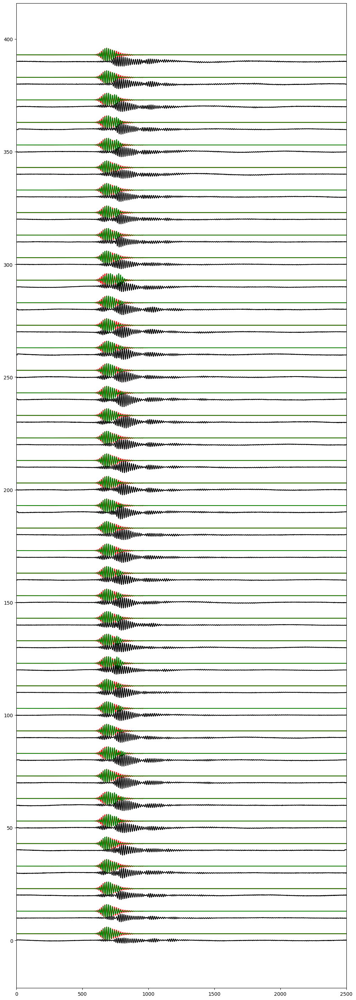

RES_refA_H11S1_2024-02-19 22:40:00_1800
Section: refB_H11S1 B 1
Number of traces in section: 38 Sampling rate 250.0 Sample length of section 2501


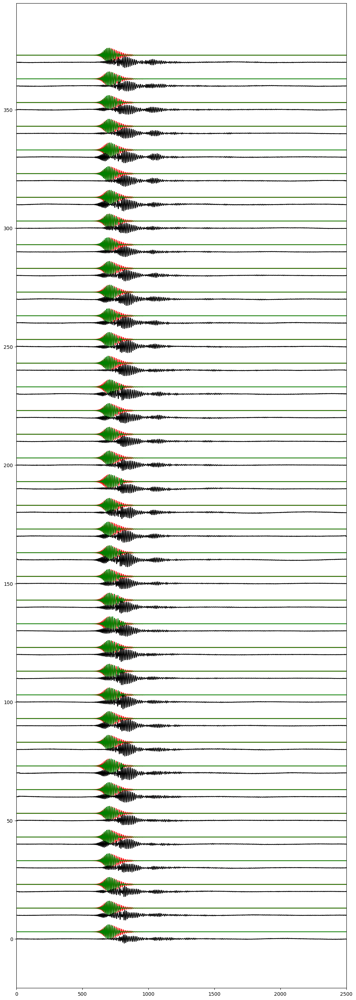

RES_refB_H11S1_2024-02-19 22:40:00_1800
Section: refA_H11S2 A 2
Number of traces in section: 40 Sampling rate 250.0 Sample length of section 2501


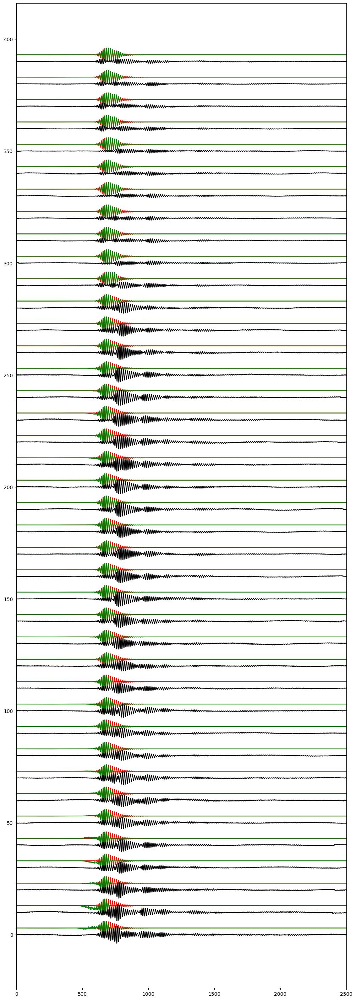

RES_refA_H11S2_2024-02-19 22:40:00_1800
Section: refB_H11S2 B 2
Number of traces in section: 38 Sampling rate 250.0 Sample length of section 2501


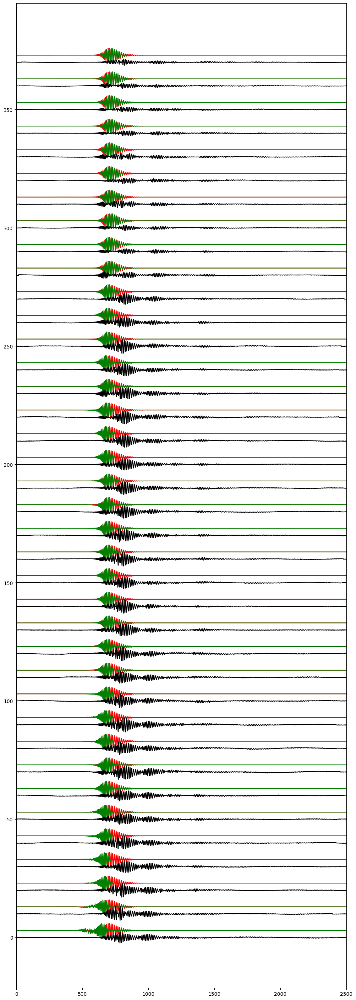

RES_refB_H11S2_2024-02-19 22:40:00_1800
Section: refA_H11S3 A 3
Number of traces in section: 40 Sampling rate 250.0 Sample length of section 2501


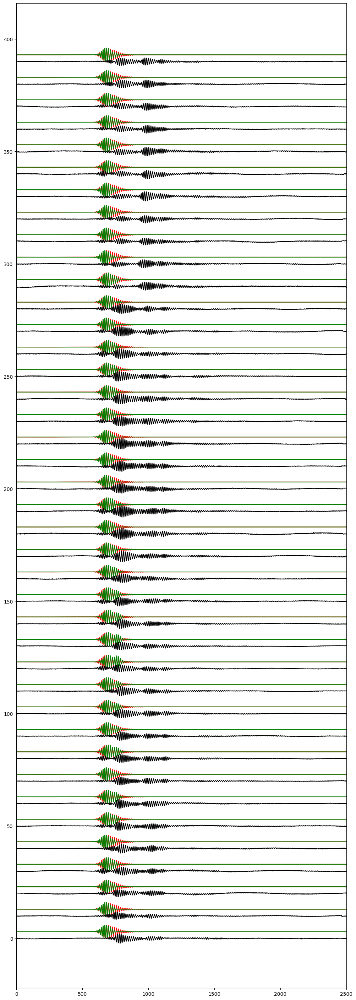

RES_refA_H11S3_2024-02-19 22:40:00_1800
Section: refB_H11S3 B 3
Number of traces in section: 38 Sampling rate 250.0 Sample length of section 2501


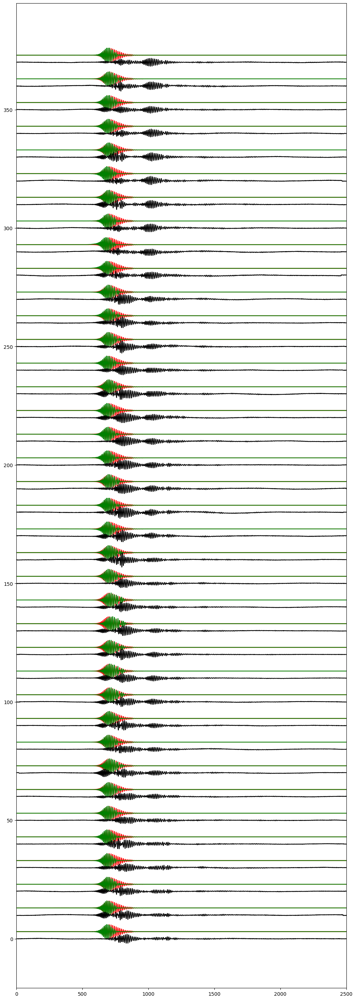

RES_refB_H11S3_2024-02-19 22:40:00_1800
nA, nB 40 38
Lengths of calib arrays A1 A2 A3: 40 40 40


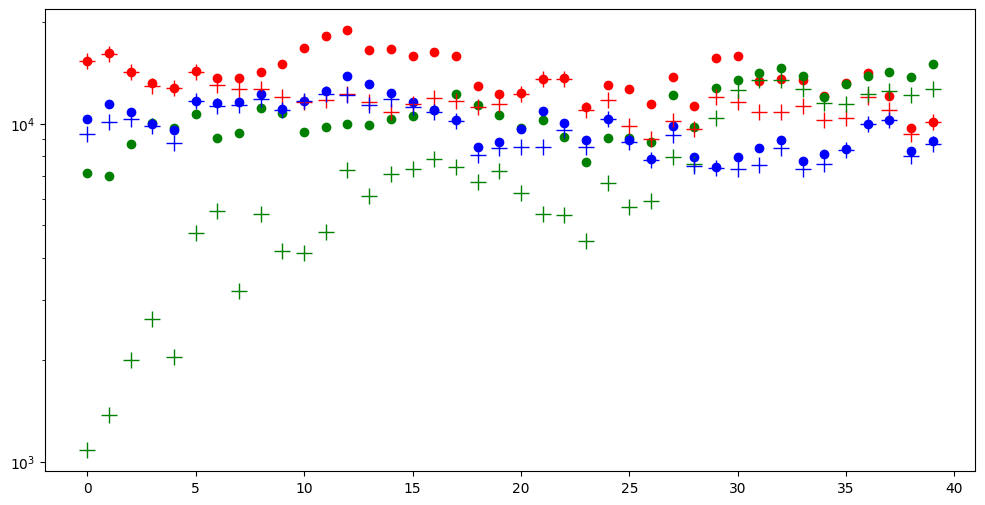

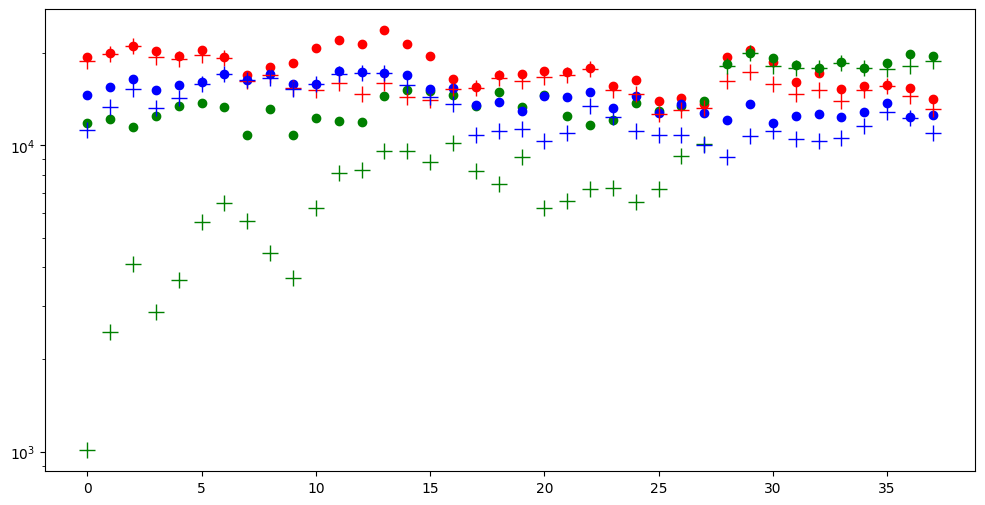

Adelay12: [ 0.596  0.556  0.408  0.444  0.512  0.364  0.404  0.38   0.256  0.332
  0.304  0.308  0.136  0.212  0.196  0.18   0.132  0.172  0.204  0.16
  0.196  0.3    0.252  0.336  0.232  0.228  0.144  0.172  0.128 -0.176
 -0.072 -0.092 -0.148 -0.064 -0.028 -0.144 -0.136 -0.124 -0.164 -0.212]


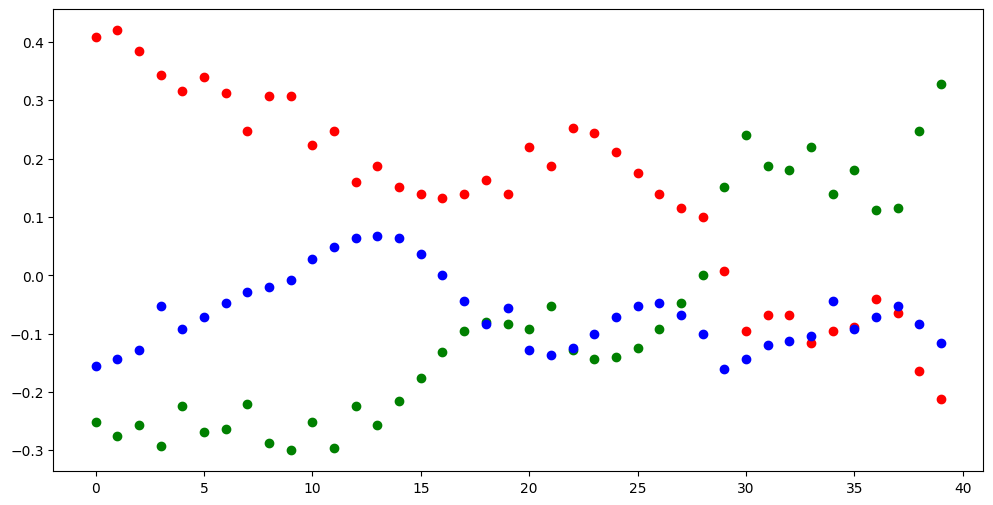

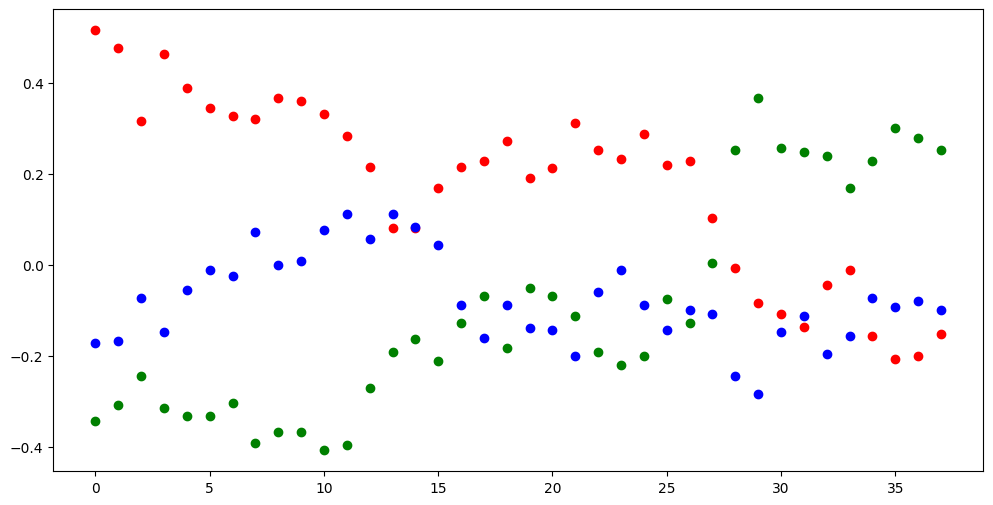

In [36]:
#
# Read section and wavelet and remove adjusted first arrival from section
#
#
dT = 10
#
delay12=np.load(path+"delay1"+"_"+timestring+"_"+str(Interval)+".npy")
delay23=np.load(path+"delay2"+"_"+timestring+"_"+str(Interval)+".npy")
delay31=np.load(path+"delay3"+"_"+timestring+"_"+str(Interval)+".npy")
tpoints=np.load(path+"times"+"_"+timestring+"_"+str(Interval)+".npy")
ctype=np.load(path+"ctype"+"_"+timestring+"_"+str(Interval)+".npy")
#
#
#
refsec1A="refA_H11S1_"+timestring+"_"+str(Interval)+".mseed"
refsec1B="refB_H11S1_"+timestring+"_"+str(Interval)+".mseed"
refsec2A="refA_H11S2_"+timestring+"_"+str(Interval)+".mseed"
refsec2B="refB_H11S2_"+timestring+"_"+str(Interval)+".mseed"
refsec3A="refA_H11S3_"+timestring+"_"+str(Interval)+".mseed"
refsec3B="refB_H11S3_"+timestring+"_"+str(Interval)+".mseed"
frefsec1A=path+"refA_H11S1_"+timestring+"_"+str(Interval)+".png"
frefsec1B=path+"refB_H11S1_"+timestring+"_"+str(Interval)+".png"
frefsec2A=path+"refA_H11S2_"+timestring+"_"+str(Interval)+".png"
frefsec2B=path+"refB_H11S2_"+timestring+"_"+str(Interval)+".png"
frefsec3A=path+"refA_H11S3_"+timestring+"_"+str(Interval)+".png"
frefsec3B=path+"refB_H11S3_"+timestring+"_"+str(Interval)+".png"
hydrophone = "H11S"
filesourceA = "Source_A"+"_"+hydrophone+"_stack_"+timestring+"_"+str(Interval)+".mseed"
filesourceB = "Source_B"+"_"+hydrophone+"_stack_"+timestring+"_"+str(Interval)+".mseed"
#
wvltA = read(path+filesourceA)
wvltB = read(path+filesourceB)
#
#
#print("Shift data length:",len(shift1A),len(shift2A),len(shift3A),len(shift1B),len(shift2B),len(shift3B))
#
#
#
sections = ["refA_H11S1","refB_H11S1","refA_H11S2","refB_H11S2","refA_H11S3","refB_H11S3"]
#
#
#
nh=280
hanning = np.hanning(nh)
#
nshifts = 0
A1calib = np.empty(0)
B1calib = np.empty(0)
A2calib = np.empty(0)
B2calib = np.empty(0)
A3calib = np.empty(0)
B3calib = np.empty(0)
A1calibw = np.empty(0)
B1calibw = np.empty(0)
A2calibw = np.empty(0)
B2calibw = np.empty(0)
A3calibw = np.empty(0)
B3calibw = np.empty(0)
Acdelay12 = np.empty(0)
Acdelay23 = np.empty(0)
Acdelay31 = np.empty(0)
Bcelay12 = np.empty(0)
Bcelay23 = np.empty(0)
Bcelay31 = np.empty(0)
Adelay12 = np.empty(0)
Bdelay12 = np.empty(0)
Adelay23 = np.empty(0)
Bdelay23 = np.empty(0)
Adelay31 = np.empty(0)
Bdelay31 = np.empty(0)
A1shift = np.empty(0)
A2shift = np.empty(0)
A3shift = np.empty(0)
B1shift = np.empty(0)
B2shift = np.empty(0)
B3shift = np.empty(0)
#
#
#
for i in range(len(tpoints)):
  if(ctype[i] == 'A'):
    Adelay12 = np.append(Adelay12,delay12[i])
    Adelay23 = np.append(Adelay23,delay23[i])
    Adelay31 = np.append(Adelay31,delay31[i])
  else:
    Bdelay12 = np.append(Bdelay12,delay12[i])
    Bdelay23 = np.append(Bdelay23,delay23[i])
    Bdelay31 = np.append(Bdelay31,delay31[i])
#
#
print("Adelay12:",Adelay12)
Acdelay12 = np.copy(Adelay12)
Acdelay23 = np.copy(Adelay23)
Acdelay31 = np.copy(Adelay31)
Bcdelay12 = np.copy(Bdelay12)
Bcdelay23 = np.copy(Bdelay23)
Bcdelay31 = np.copy(Bdelay31)
print("Acdelay12:",Acdelay12)
#
#
#
for section in sections:
  fig, ax = plt.subplots(1, 1, figsize=(12, 36),  )
  calltype = section[3:4]
  hyd = section[9:10]
  print("Section:",section, calltype, hyd)
  fsec=section+"_"+timestring+"_"+str(Interval)+".mseed"
  sec = read(path+fsec)
  sp = sec[0].stats.sampling_rate
  lenT = len(sec[0].data)
  mask = st.Trace()
  mask.data = np.zeros(lenT)
  start = 2.2
  mask.stats.sampling_rate = sp
  nh=280
  hanning = np.hanning(nh)
  for k in range(nh):
    mask.data[k+int(start*sp)] = hanning[k]
  print("Number of traces in section:",len(sec), "Sampling rate", sp, "Sample length of section", lenT)
#
#
# Find detection on other envelope within +- 3s.
# Skip if less than three seconds after previous pick
#
  ntraces = len(sec)
  #shift_calib = np.empty(0)
  tres = st.Trace()
  res = st.Stream(traces=[tres])
  res.remove(tres)
  for i in range(ntraces):
#
#
#
    wvlt = np.zeros(lenT)
#    print(sec[i])
    w = sec[i].detrend(type='linear').data
    fk = [-1,1.]
    cfreq = frq.central_frequency(w, sp, 0.5, fk)
    if(cfreq < 20):
      for j in range(1000):
        wvlt[j] += wvltA[0].data[j]
    else:
      for j in range(1000):
        wvlt[j] += wvltB[0].data[j]
#    print("Central frequency:",cfreq)
#
#
#
    mw = np.copy(w*mask.data)
    normw = np.max(mw)
    norm = np.max(w)
#    print("Norm:",norm, normw)
    tres = st.Trace()
#
#
#
    cross=cc.correlate(mw, wvlt, shift=200, demean=True,
                       normalize='naive', method='auto')
#
#
    (scc,mcc)=cc.xcorr_max(cross,abs_max=False)
#    shift_calib=np.append(shift_calib,scc)
    if (section == "refA_H11S1"):
      A1calib = np.append(A1calib,norm)
      A1calibw = np.append(A1calibw,normw)
      A1shift = np.append(A1shift,scc/sp)
    if (section == "refB_H11S1"):
      B1calib = np.append(B1calib,norm)
      B1calibw = np.append(B1calibw,normw)
      B1shift = np.append(B1shift,scc/sp)
    if (section == "refA_H11S2"):
      A2calib = np.append(A2calib,norm)
      A2calibw = np.append(A2calibw,normw)
      A2shift = np.append(A2shift,scc/sp)
    if (section == "refB_H11S2"):
      B2calib = np.append(B2calib,norm)
      B2calibw = np.append(B2calibw,normw)
      B2shift = np.append(B2shift,scc/sp)
    if (section == "refA_H11S3"):
      A3calib = np.append(A3calib,norm)
      A3calibw = np.append(A3calibw,normw)
      A3shift = np.append(A3shift,scc/sp)
    if (section == "refB_H11S3"):
      B3calib = np.append(B3calib,norm)
      B3calibw = np.append(B3calibw,normw)
      B3shift = np.append(B3shift,scc/sp)
#
#    print("Cross correlation:",scc,mcc)
#
    smw = np.roll(mw,-1*int(scc))/normw
    sw = np.roll(w,-1*int(scc))/norm
    plt.plot(10*i+3+3*wvlt,'r')
    plt.plot(10*i+3+3*smw,'g')
    plt.plot(10*i+3*(sw-wvlt),'k')
    plt.xlim([0,2501])
    tres.data = sw-wvlt
    tres.stats.sampling_rate = sp
#    tres.stats.starttime = sec[i].stats.distance
    tres.stats.distance = i
    res.append(tres)
#
  plt.show()
  fcalib="CAL_"+section+"_"+timestring+"_"+str(Interval)
#  print(fcalib)
  fshift_calib="SHIFT_CAL_"+section+"_"+timestring+"_"+str(Interval)
#  print(fshift_calib)
#  np.save(path+fcalib,calib)
#  np.save(path+fshift_calib,shift_calib)
#
  foutfile = "RES_"+section+"_"+timestring+"_"+str(Interval)
  print(foutfile)
  res.write(path+foutfile+".mseed",format="MSEED")
  res.plot(outfile=path+foutfile+".png",
            format = 'png' , type='section', scale=1, recordstart=2, recordlength= 3,  linewidth=1,  color = 'red', fillcolors= (None,None) )
#  fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
#  plt.plot(shift_calib)
#  plt.show()
#
#  Correct the delay measurements with shift from absolute pick
#
#
#
nA = len(Acdelay12)
nB = len(Bcdelay12)
print("nA, nB", nA, nB)
for i in range(ntraces):
    Acdelay12[i] =  - A1shift[i] + A2shift[i]
    Acdelay23[i] =  - A2shift[i] + A3shift[i]
    Acdelay31[i] =  - A3shift[i] + A1shift[i]
    Bcdelay12[i] =  - B1shift[i] + B2shift[i]
    Bcdelay23[i] =  - B2shift[i] + B3shift[i]
    Bcdelay31[i] =  - B3shift[i] + B1shift[i]
#
#
#
#
#
#
print("Lengths of calib arrays A1 A2 A3:", len(A1calib), len(A2calib), len(A3calib))
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
plt.plot(A1calib,'r.',A2calib,'g.',A3calib,'b.', markersize=12)
plt.plot(A1calibw,'r+',A2calibw,'g+',A3calibw,'b+', markersize=12)
ax.set_yscale('log')
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
plt.plot(B1calib,'r.',B2calib,'g.',B3calib,'b.', markersize=12)
plt.plot(B1calibw,'r+',B2calibw,'g+',B3calibw,'b+', markersize=12)
ax.set_yscale('log')
plt.show()
print("Adelay12:",Adelay12)
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
plt.plot(Acdelay12,'r.',Acdelay23,'g.',Acdelay31,'b.', markersize=12)
#plt.plot(Adelay12,'ro',Adelay23,'go',Adelay31,'bo', markersize=12)
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
plt.plot(Bdelay12,'r.',Bdelay23,'g.',Bdelay31,'b.', markersize=12)
#plt.plot(Bcdelay12,'ro',Bcdelay23,'go',Bcdelay31,'bo', markersize=12)
plt.show()

[link text](https://)